# Imports

In [44]:
# Cargar OpenCV
import cv2
import argparse
import imutils
# Sirve para operar con cualquier dato numérico
import numpy as np
import matplotlib.pyplot as plt
import matplotlib._color_data as mcd
import matplotlib.patches as mpatch

In [33]:
colors = [name for name in mcd.CSS4_COLORS]

In [77]:
# Leer las imágenes que vamos a comparar
# Imagen sobre la que vamos a detectar si existe otra imagen
img_rgb = cv2.imread('casas3.png')

# Imagen que comprobamos si existe en la imagen Todo
images_name = ['detm.png','det.png','det2.png','det2.png','detm2.png','detm3.png']
imageList = []
for image in images_name:
    template = cv2.imread(image)
    imageList.append(template)
    
    
height, width, channels = template.shape
rotated = img_rgb

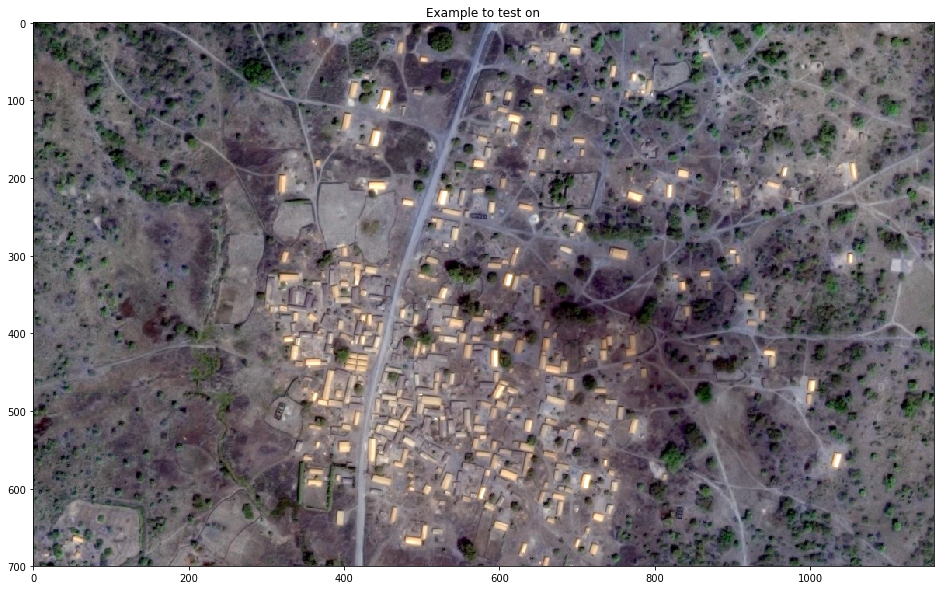

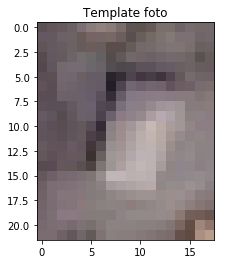

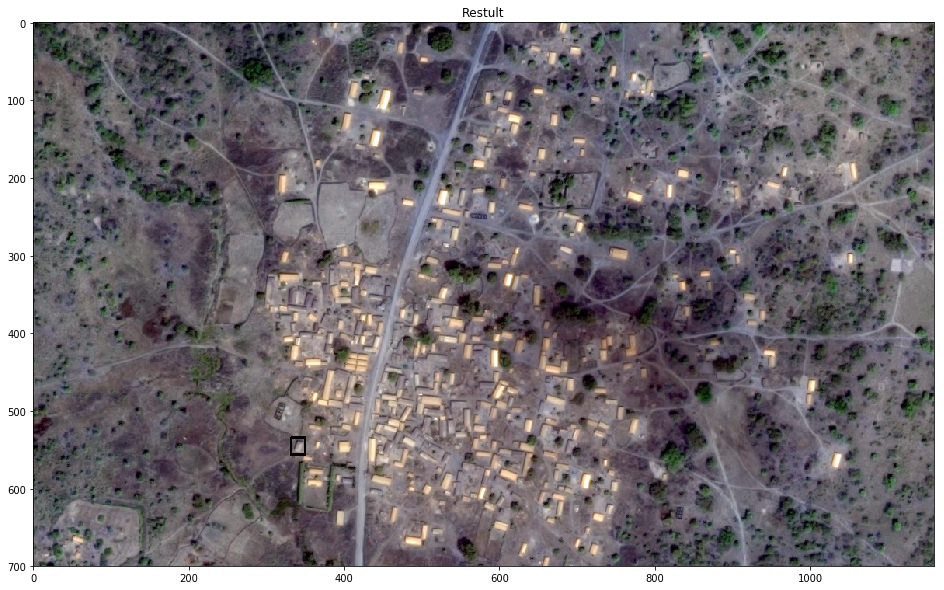

In [72]:
f, ax = plt.subplots(figsize=(20,10))
ax.set_title('Example to test on')
ax.imshow(img_rgb)

plt.show()

plt.title('Template foto')
plt.imshow(template)
plt.show()


img_results=img_rgb.copy()

h, w = template.shape[:-1]

res = cv2.matchTemplate(img_results, template, cv2.TM_CCOEFF_NORMED)

threshold = .8
loc = np.where(res >= threshold)

R = 0
G = 0
B = 0

for pt in zip(*loc[::-1]):  #  Cambiar columnas y filas
    cv2.rectangle(img_results, pt, (pt[0] + w, pt[1] + h), (R, G, B), 1)


f, ax = plt.subplots(figsize=(20,10))
ax.set_title('Restult')
ax.imshow(img_results)

plt.show()


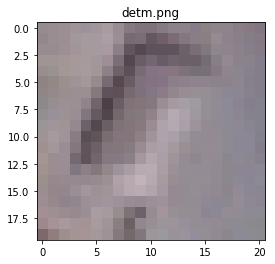

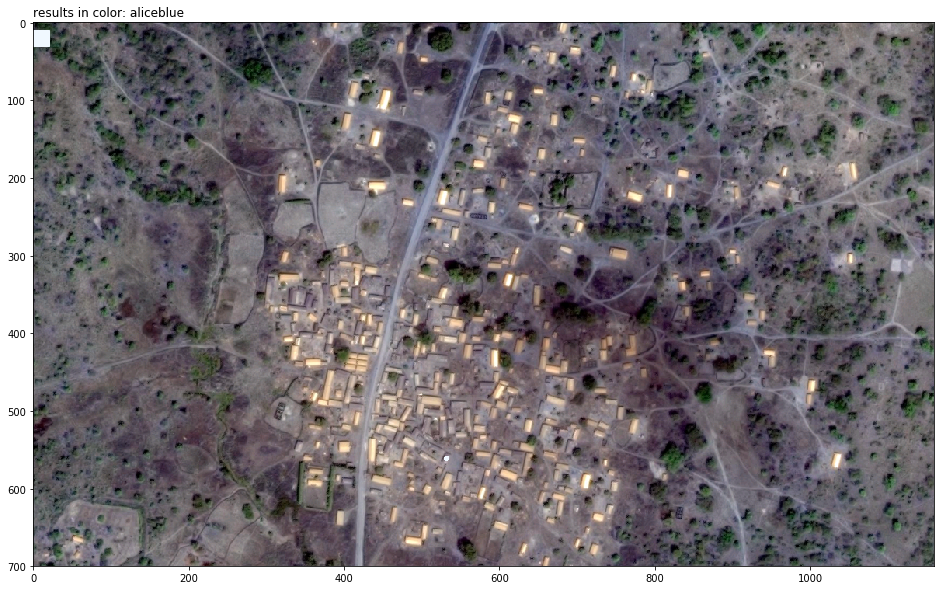

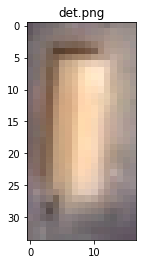

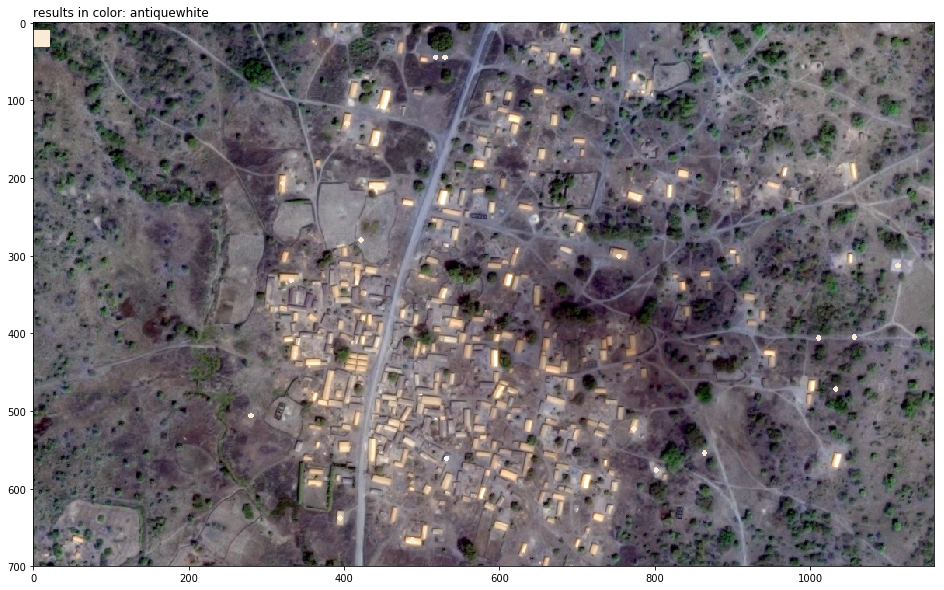

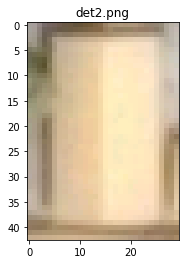

...

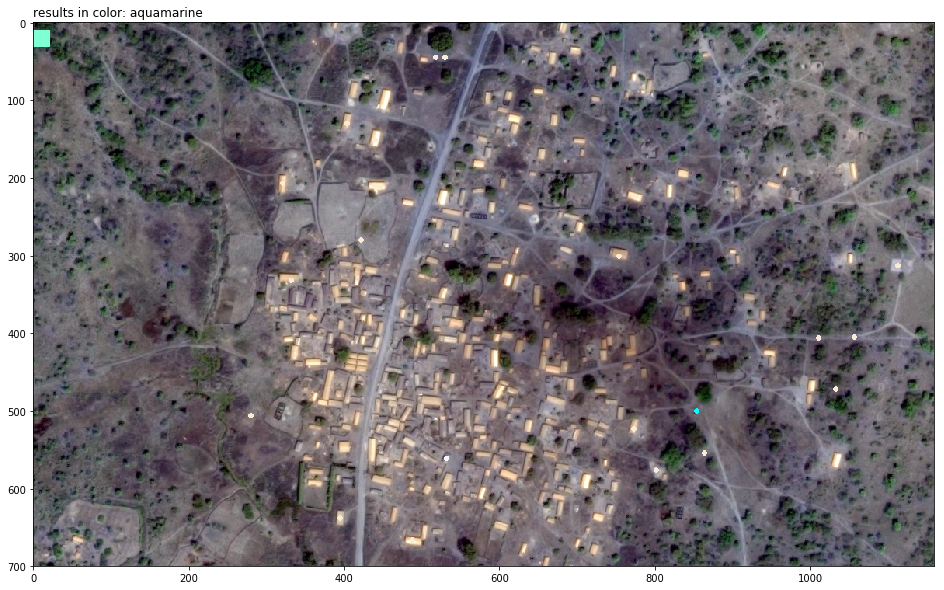

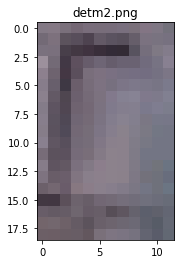

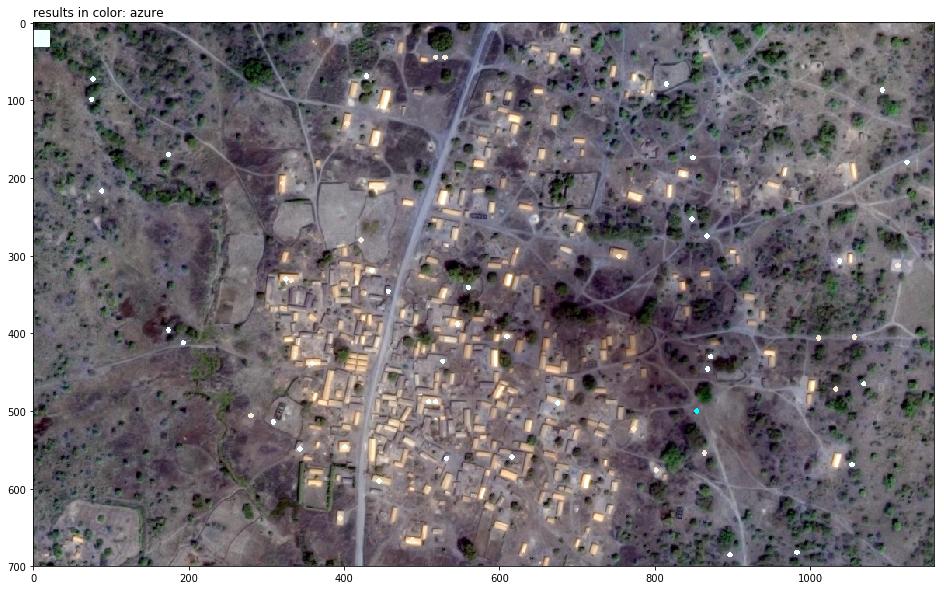

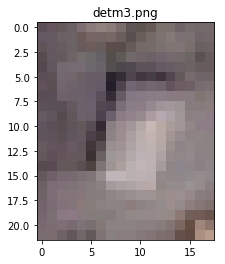

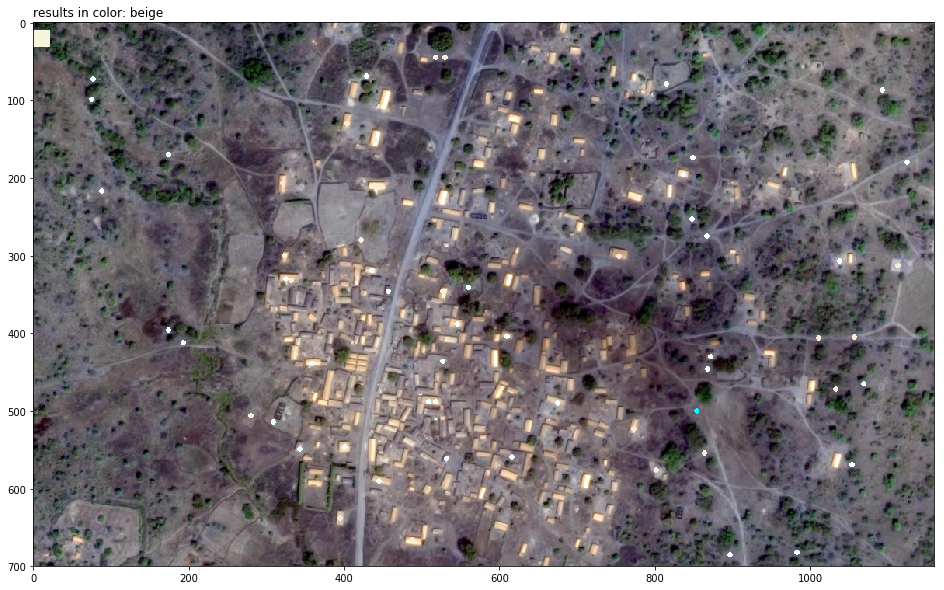

In [88]:

#select method
girarImagen = False

#copy_image
img_results = img_rgb.copy()

if(girarImagen == True):
    results_centers = []
    for template,name,col in zip(imageList,images_name,colors):
        for angle in np.arange(0,360,2):
            rotated = imutils.rotate(template, angle)
            height, width, channels = rotated.shape
            h, w = rotated.shape[:-1]

            # Función que sirve para detectar si una imagen está contenida en otra
            res = cv2.matchTemplate(img_results, rotated, cv2.TM_CCOEFF_NORMED)

            # Umbral admitido
            threshold = .8

            # Si está dentro del umbral, crear un cuadrado sobre la imagen contenida en la imagen Todo
            loc = np.where(res >= threshold)
            color=mcd.CSS4_COLORS[col]
            R = int(color[1:3],16) 
            G = int(color[3:5],16) 
            B = int(color[5:7],16)
            
            for pt in zip(*loc[::-1]):  #  Cambiar columnas y filas
                center= (pt[0] + int(w/2), pt[1] + int(h/2))
                if not center in results_centers:
                    cv2.circle(img_results, center, 2, (R, G, B), 2)
                    results_centers.append(center)
                    for i in range(12):
                        for n in range(12):
                            center_moved=(center[0] + i-5, center[1] + n-5)
                            results_centers.append(center_moved)
        plt.title(name)
        plt.imshow(template)
        plt.show()

        f, ax = plt.subplots(figsize=(20,10))
        ax.set_title('results in color: '+col,loc='left')
        r1 = mpatch.Rectangle((0, 10), 20, 20, color=color)
        ax.add_patch(r1)

        ax.imshow(img_results)

        plt.show()

    

if(girarImagen == False):
    results_corners = []
    for template,name,col in zip(imageList,images_name,colors):
        h, w = template.shape[:-1]
 
        # Función que sirve para detectar si una imagen está contenida en otra
        res = cv2.matchTemplate(img_results, template, cv2.TM_CCOEFF_NORMED)
 
        # Umbral admitido
        threshold = .65
 
        # Si está dentro del umbral, crear un cuadrado sobre la imagen contenida en la imagen Todo
        loc = np.where(res >= threshold)
        color=mcd.CSS4_COLORS[col]
        R = int(color[1:3],16) 
        G = int(color[3:5],16) 
        B = int(color[5:7],16)
        
        for pt in zip(*loc[::-1]):  #  Cambiar columnas y filas
            corner=pt
            if not corner in results_corners:
                cv2.rectangle(img_results, corner, (corner[0] + w, corner[1] + h), (R, G, B), 2)
                results_corners.append(corner)
                for i in range(16):
                    for n in range(16):
                        corner_moved=(corner[0] + i-5, corner[1] + n-5)
                        results_corners.append(corner_moved)

        plt.title(name)
        plt.imshow(template)
        plt.show()
        
        f, ax = plt.subplots(figsize=(20,10))
        ax.set_title('results in color: '+col,loc='left')
        r1 = mpatch.Rectangle((0, 10), 20, 20, color=color)
        ax.add_patch(r1)
        
        ax.imshow(img_results)
        
        plt.show()


In [ ]:
# Guardar el resultado
#cv2.imwrite('result.png', img_rgb)